In [4]:
import pandas as pd
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [5]:
meta_df = pd.read_csv('./dataset/meta_df.csv')

Link Dataset : [Kaggle](https://www.kaggle.com/datasets/kneroma/tacotrashdataset)

In [6]:
X = []
y = []

In [7]:
for index, row in meta_df.iterrows():
    img_path = os.path.join('./dataset/data', row['img_file'])
    
    # Membaca gambar
    img = cv2.imread(img_path)
    if img is not None:
        img = cv2.resize(img, (64, 64))
        img = img.flatten()
        
        X.append(img)
        y.append(row['cat_name'])

In [8]:
X = np.array(X)
y = np.array(y)

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [10]:
datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [11]:
X_train = X_train.reshape(-1, 64, 64, 3)

In [12]:
augmented_images = []
augmented_labels = []

for img, label in zip(X_train, y_train):
    img = img.reshape((1, 64, 64, 3))  # Ubah kembali ke bentuk 4D
    for batch in datagen.flow(img, batch_size=1):
        augmented_images.append(batch[0])  # Menyimpan gambar augmentasi
        augmented_labels.append(label)  # Menyimpan label yang sesuai
        if len(augmented_images) >= 100:  # Batasi jumlah augmentasi, misalnya 100 gambar
            break

In [13]:
X_train_augmented = np.concatenate((X_train.reshape(-1, 64 * 64 * 3), np.array(augmented_images).reshape(-1, 64 * 64 * 3)), axis=0)
y_train_augmented = np.concatenate((y_train, np.array(augmented_labels)), axis=0)

# 1. Kernel = Linear

In [12]:
model = svm.SVC(kernel='linear')

In [13]:
model.fit(X_train_augmented, y_train_augmented)

SVC(kernel='linear')

In [14]:
y_pred = model.predict(X_test)

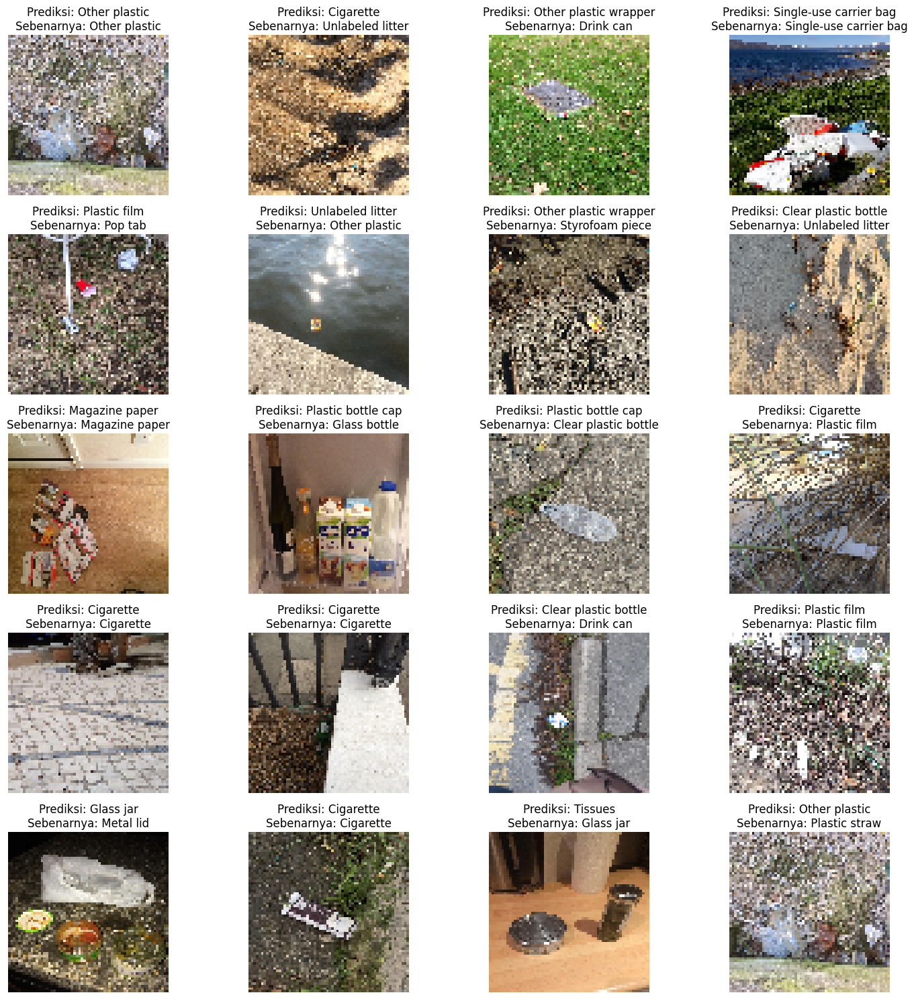

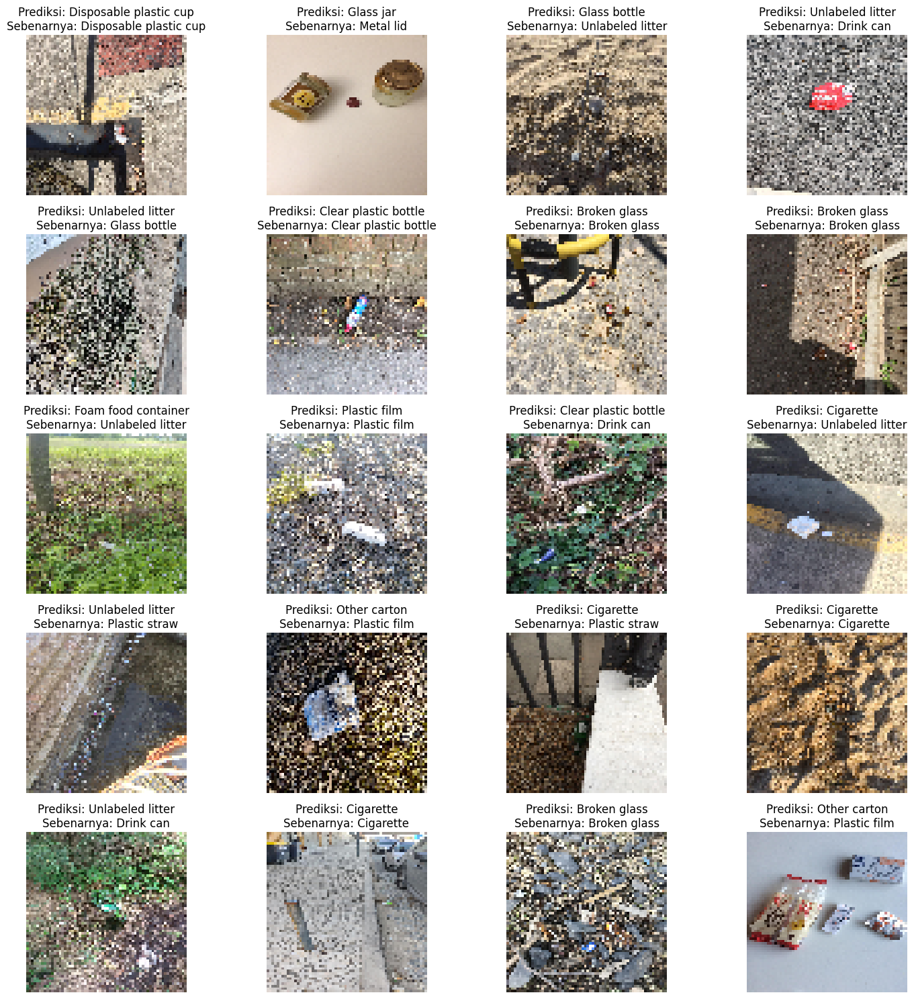

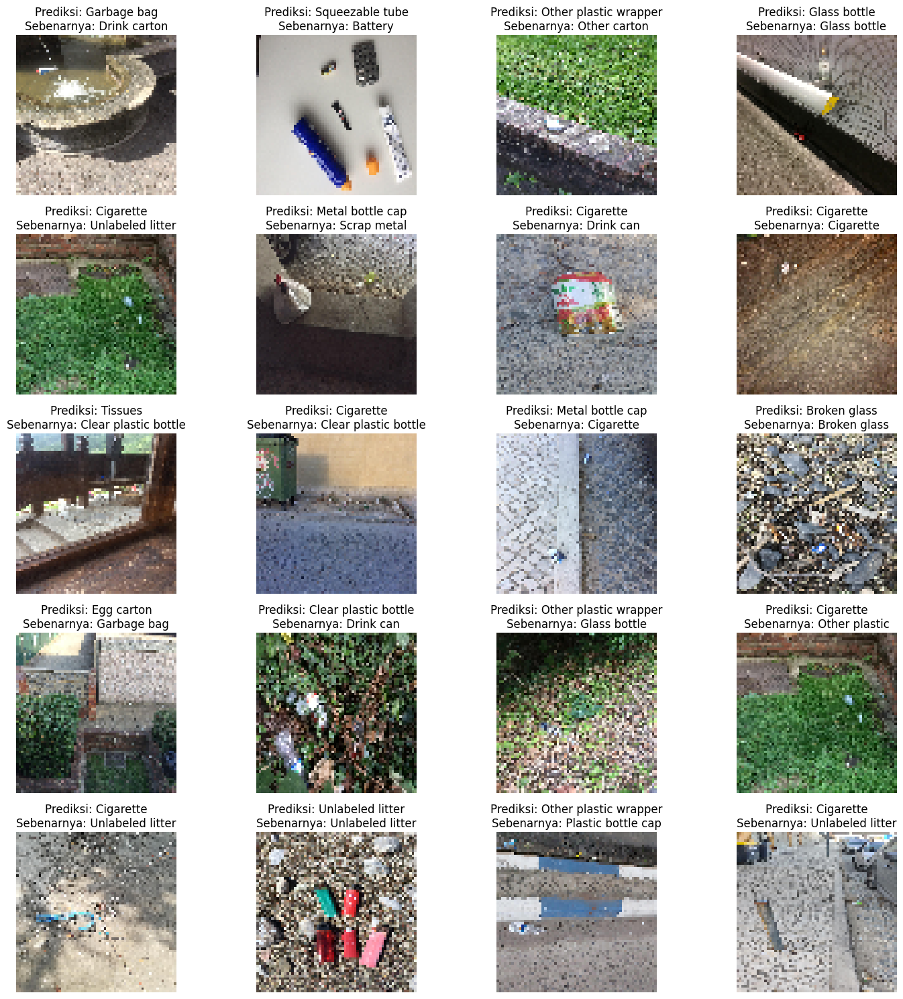

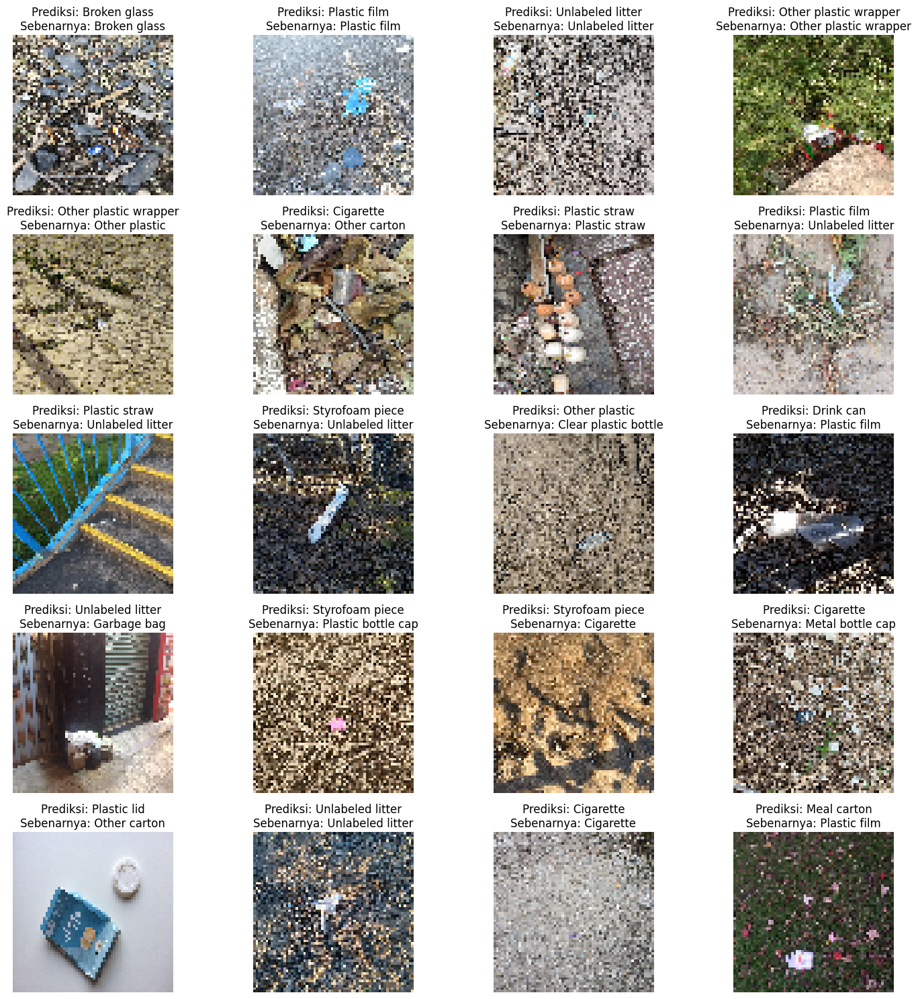

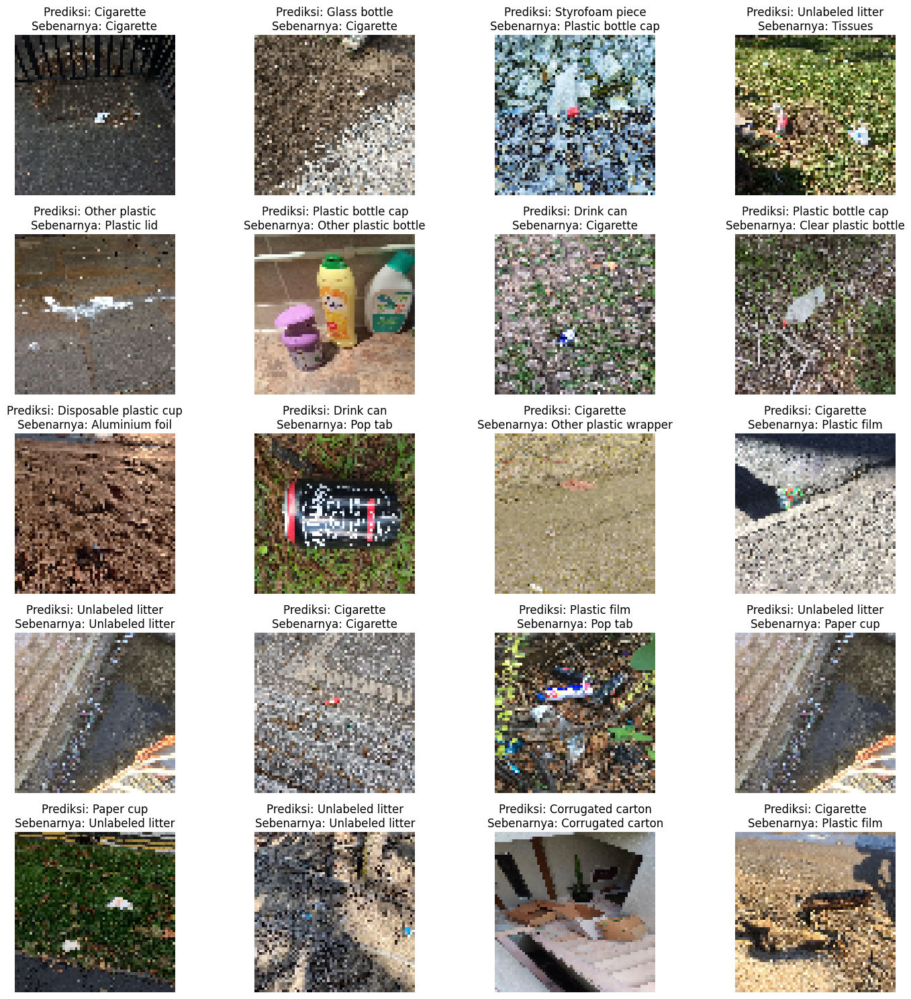

...

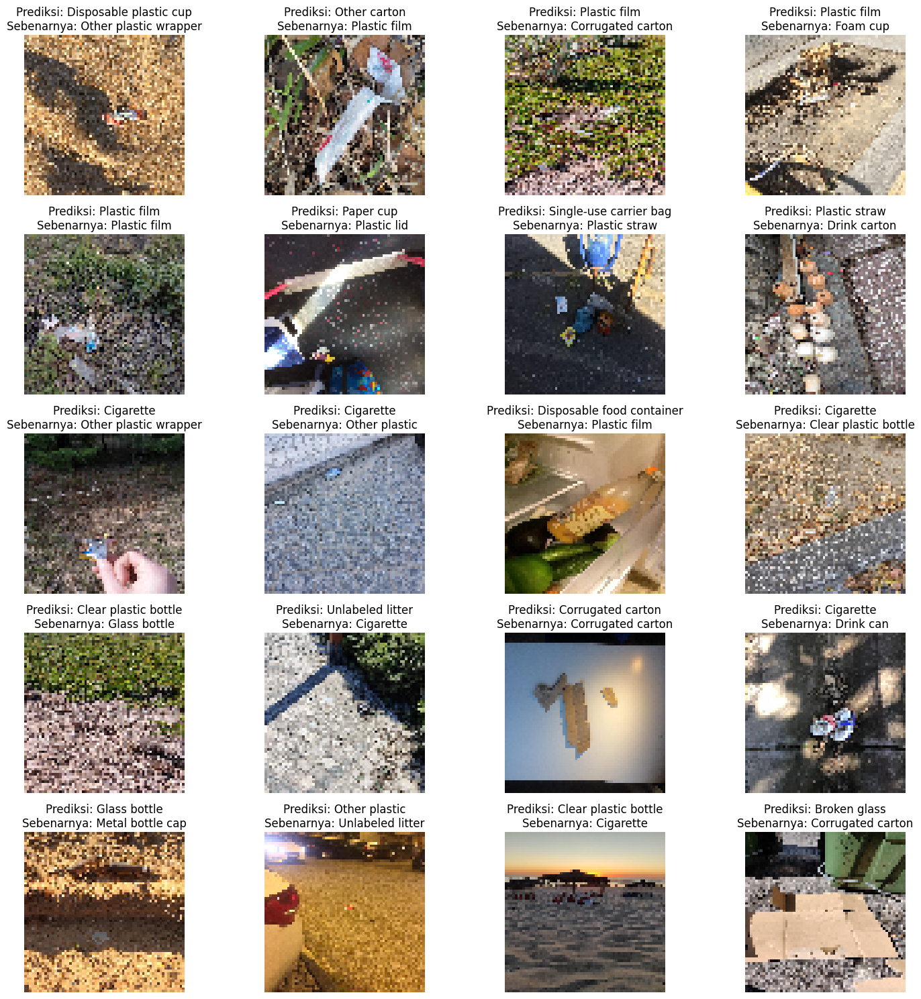

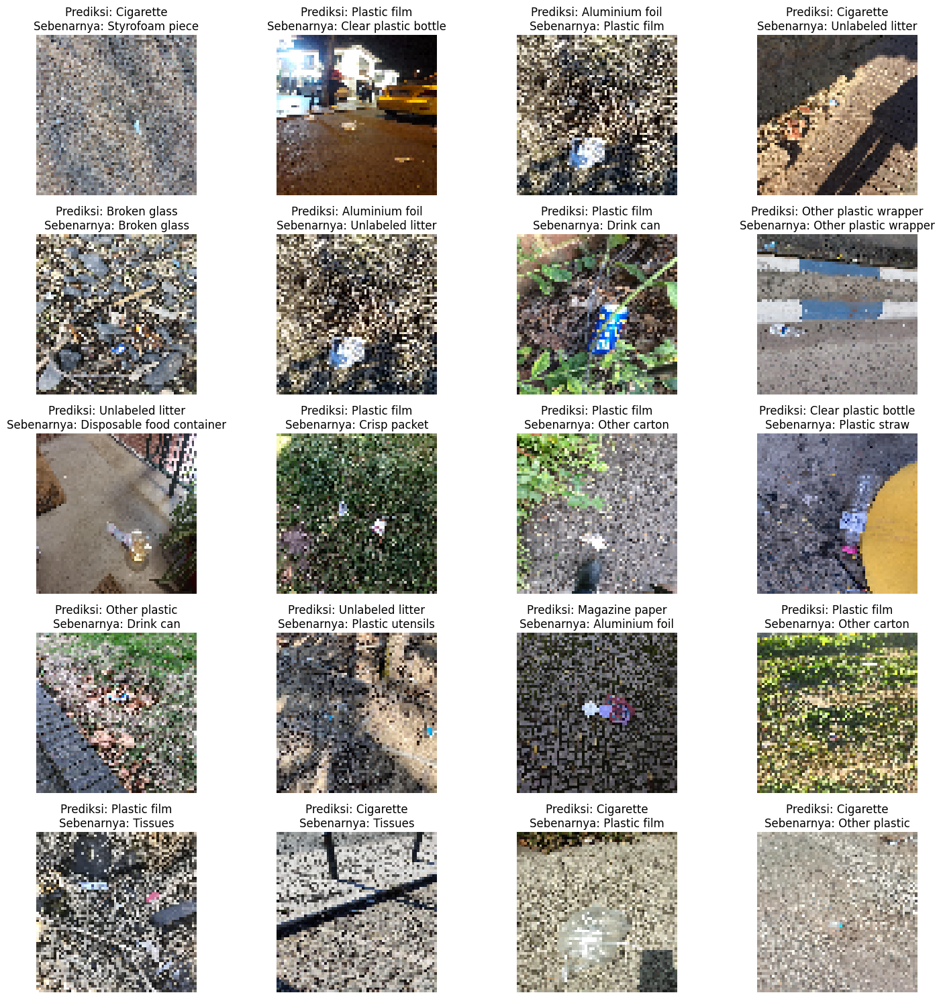

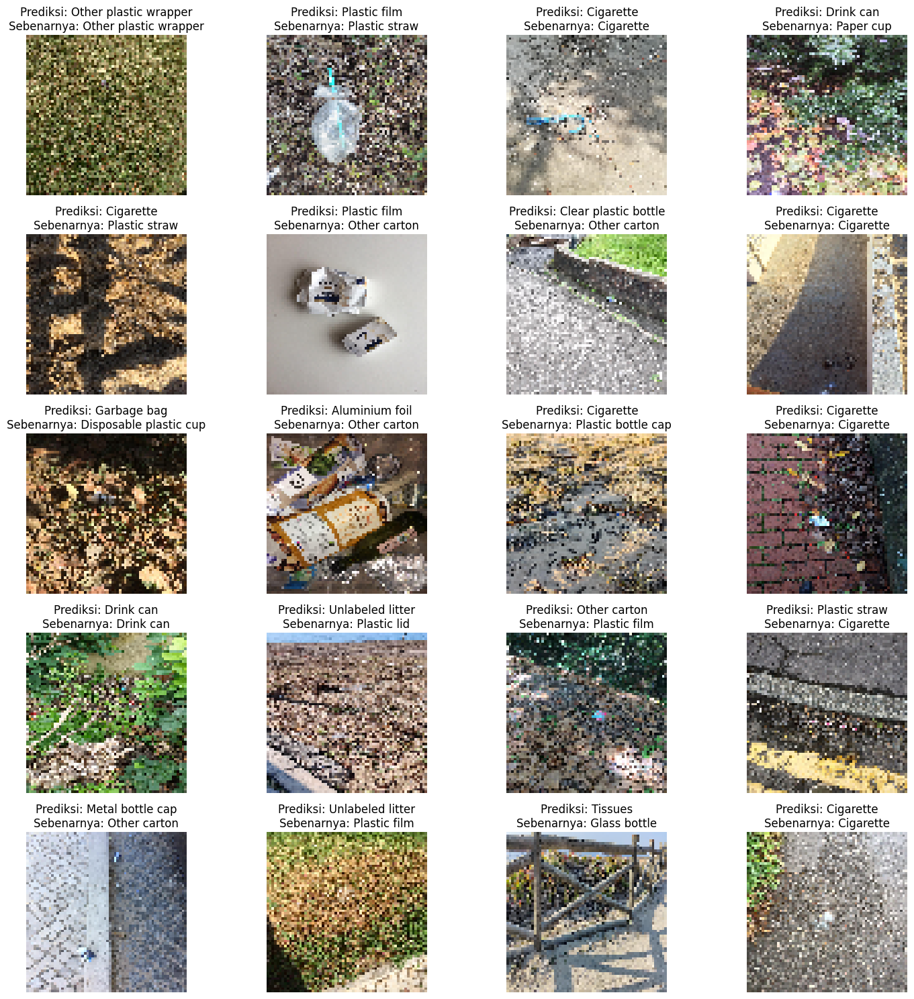

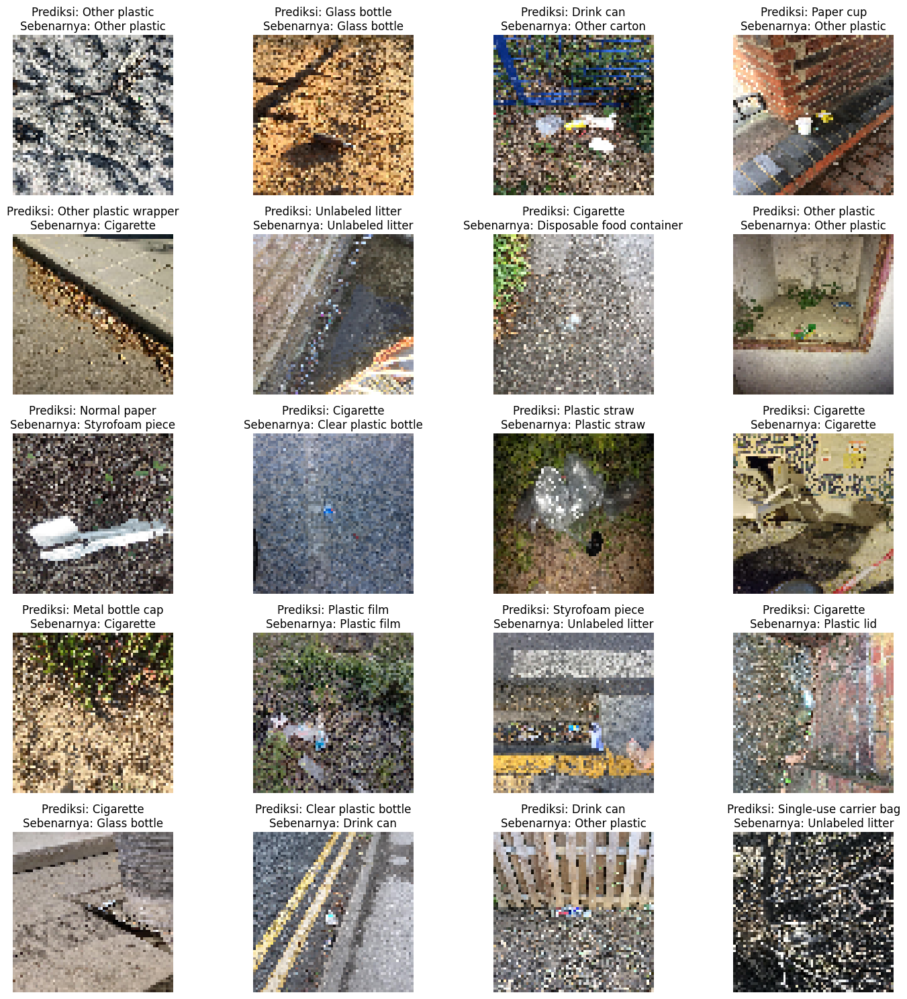

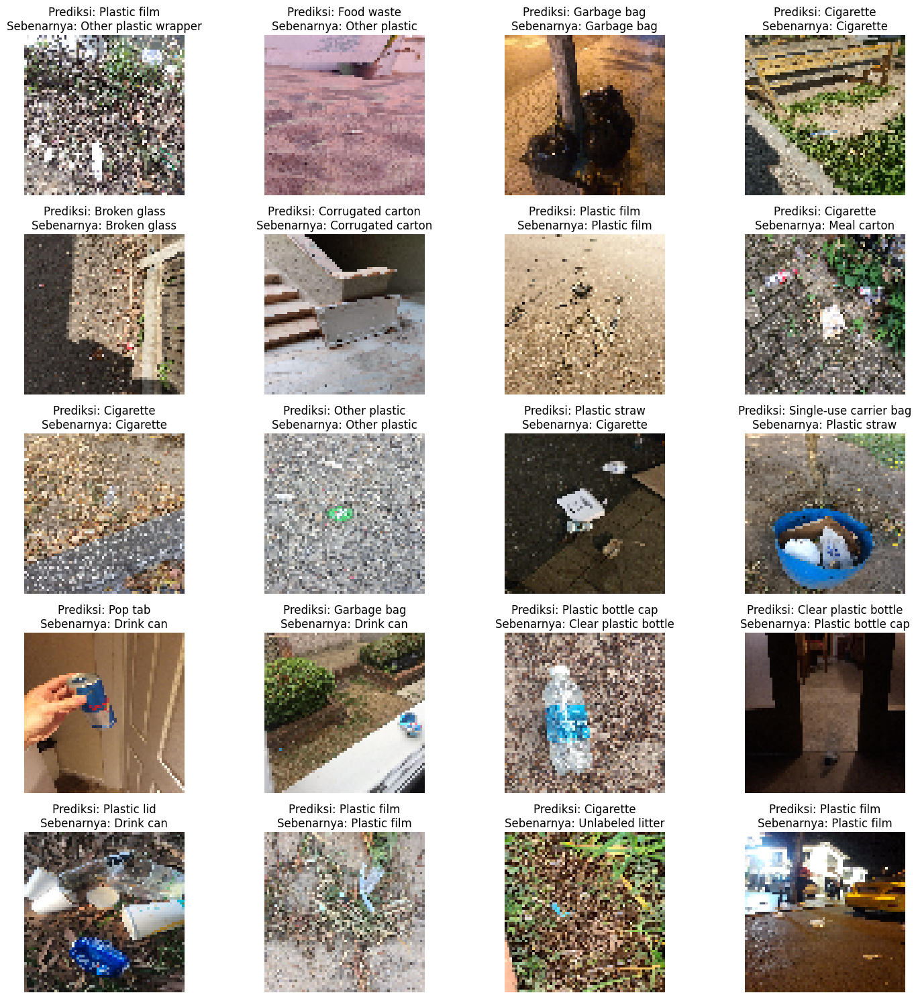

In [ ]:
num_images = 1000
images_per_page = 20
num_pages = (num_images // images_per_page) + 1

for page in range(num_pages):
    start_idx = page * images_per_page
    end_idx = start_idx + images_per_page
    
    plt.figure(figsize=(15, 15))
    for i in range(start_idx, min(end_idx, num_images)):
        img = X_test[i].reshape(64, 64, 3)
        plt.subplot(5, 4, i % images_per_page + 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Prediksi: {y_pred[i]}\nSebenarnya: {y_test[i]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [3]:
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Confusion Matrix:


NameError: name 'y_test' is not defined

# 2. Kernel = RBF

In [14]:
model = svm.SVC(kernel='rbf', C=1, gamma='scale')

In [ ]:
model.fit(X_train_augmented, y_train_augmented)

In [ ]:
y_pred = model.predict(X_test)

In [ ]:
num_images = 1000
images_per_page = 20
num_pages = (num_images // images_per_page) + 1

for page in range(num_pages):
    start_idx = page * images_per_page
    end_idx = start_idx + images_per_page
    
    plt.figure(figsize=(15, 15))
    for i in range(start_idx, min(end_idx, num_images)):
        img = X_test[i].reshape(64, 64, 3)
        plt.subplot(5, 4, i % images_per_page + 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Prediksi: {y_pred[i]}\nSebenarnya: {y_test[i]}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()